# Naive Bayes
# Question_1 Salary Data Test)

In [2]:
# Author : Shreyas Shashikant Vaishnav
# Purpose : Naive Bayes
# Dataset : Salary Data Test

In [3]:
#importing the basic libraries
import pandas as pd
import numpy as np
from sklearn.metrics import classification_report
from sklearn.naive_bayes import GaussianNB

from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split, cross_val_score

In [4]:
#import dataset
salary=pd.read_csv(r"D:\Resume\Data Science\Assignments_SV\Data Science Assignment\Naive Bayes\SalaryData_Test.csv")

salary.head()

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,25,Private,11th,7,Never-married,Machine-op-inspct,Own-child,Black,Male,0,0,40,United-States,<=50K
1,38,Private,HS-grad,9,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50,United-States,<=50K
2,28,Local-gov,Assoc-acdm,12,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,40,United-States,>50K
3,44,Private,Some-college,10,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,7688,0,40,United-States,>50K
4,34,Private,10th,6,Never-married,Other-service,Not-in-family,White,Male,0,0,30,United-States,<=50K


In [5]:
# To get the basic idea of the salary data

salary.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15060 entries, 0 to 15059
Data columns (total 14 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   age            15060 non-null  int64 
 1   workclass      15060 non-null  object
 2   education      15060 non-null  object
 3   educationno    15060 non-null  int64 
 4   maritalstatus  15060 non-null  object
 5   occupation     15060 non-null  object
 6   relationship   15060 non-null  object
 7   race           15060 non-null  object
 8   sex            15060 non-null  object
 9   capitalgain    15060 non-null  int64 
 10  capitalloss    15060 non-null  int64 
 11  hoursperweek   15060 non-null  int64 
 12  native         15060 non-null  object
 13  Salary         15060 non-null  object
dtypes: int64(5), object(9)
memory usage: 1.6+ MB


In [6]:
salary.describe()

,age,educationno,capitalgain,capitalloss,hoursperweek
count,15060.000000,15060.000000,15060.000000,15060.000000,15060.000000
mean,38.768327,10.112749,1120.301594,89.041899,40.951594
std,13.380676,2.558727,7703.181842,406.283245,12.062831
min,17.000000,1.000000,0.000000,0.000000,1.000000
25%,28.000000,9.000000,0.000000,0.000000,40.000000
50%,37.000000,10.000000,0.000000,0.000000,40.000000
75%,48.000000,13.000000,0.000000,0.000000,45.000000
max,90.000000,16.000000,99999.000000,3770.000000,99.000000


In [7]:
#converting dtypes data to the categorical type

salary['workclass']=salary['workclass'].astype('category')
salary['education']=salary['education'].astype('category')
salary['maritalstatus']=salary['maritalstatus'].astype('category')
salary['occupation']=salary['occupation'].astype('category')
salary['relationship']=salary['relationship'].astype('category')
salary['race']=salary['race'].astype('category')
salary['native']=salary['native'].astype('category')
salary['sex']=salary['sex'].astype('category')

In [8]:
salary.columns

Index(['age', 'workclass', 'education', 'educationno', 'maritalstatus',
       'occupation', 'relationship', 'race', 'sex', 'capitalgain',
       'capitalloss', 'hoursperweek', 'native', 'Salary'],
      dtype='object')

<AxesSubplot:>

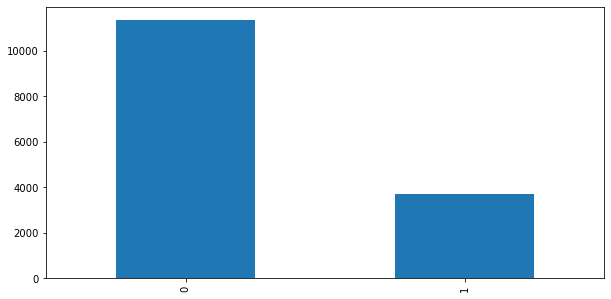

In [30]:
salary['Salary'].value_counts().plot(x = 'sex', y ='Salary', kind = 'bar', figsize = (10,5)  )

In [9]:
import plotly.express as px

fig = px.histogram(salary, x="age", y="capitalgain", color="sex",
                   marginal="box", # or violin, rug
                   hover_data=salary.columns)
fig.show()

In [10]:
fig = px.histogram(salary, x="capitalgain", y="educationno", color="Salary",
                   marginal="box", # or violin, rug
                   hover_data=salary.columns)
fig.show()

In [11]:
# checking the data types of data

salary.dtypes

age                 int64
workclass        category
education        category
educationno         int64
maritalstatus    category
occupation       category
relationship     category
race             category
sex              category
capitalgain         int64
capitalloss         int64
hoursperweek        int64
native           category
Salary             object
dtype: object

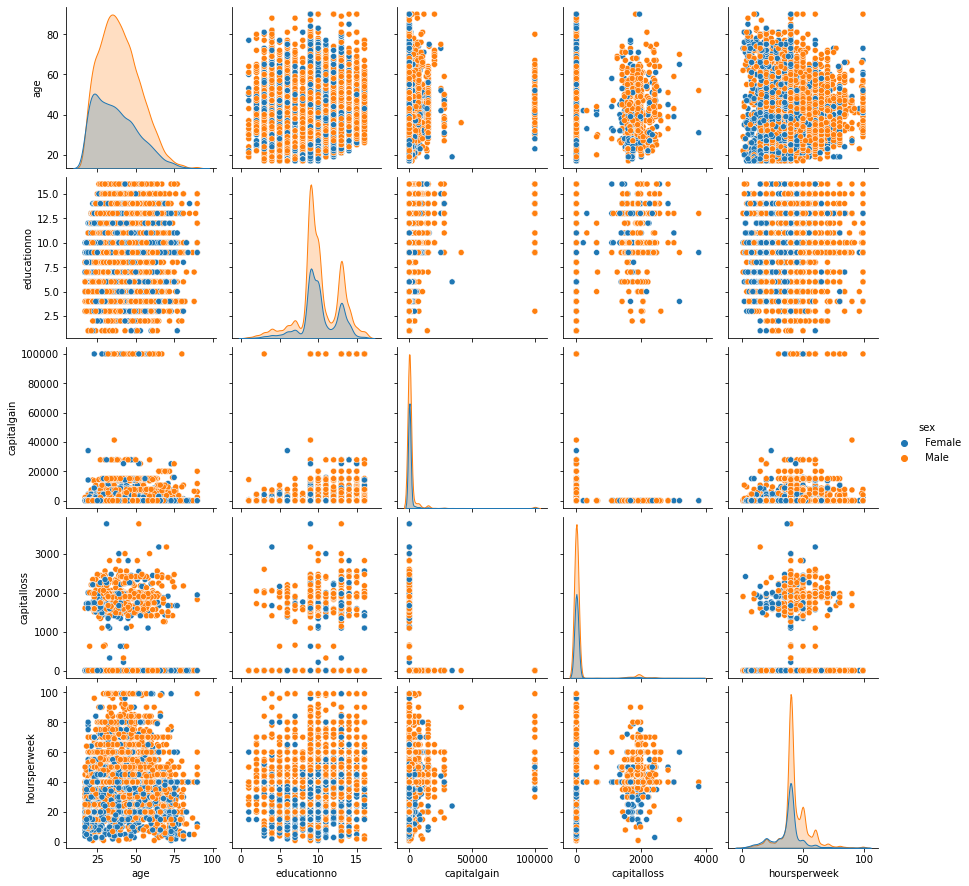

In [12]:
import seaborn as sns 
import matplotlib.pyplot as plt

sns.pairplot(salary, hue ='sex')
# to show
plt.show()

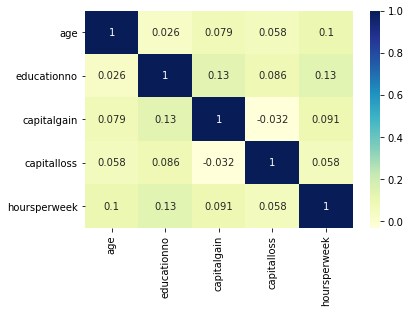

In [13]:
dataplot = sns.heatmap(salary.corr(), cmap="YlGnBu", annot=True)
  
# displaying heatmap
plt.show()

In [14]:
# importing the encoder 

from sklearn import preprocessing                      
label_encoder = preprocessing.LabelEncoder()

In [15]:
# encoding the salary column of the and also tranforming

salary['Salary'] = label_encoder.fit_transform(salary['Salary'])

In [16]:
salary.Salary

0        0
1        0
2        1
3        1
4        0
        ..
15055    0
15056    0
15057    0
15058    0
15059    1
Name: Salary, Length: 15060, dtype: int32

In [17]:
# printing the unique values

salary.Salary.unique()

array([0, 1])

In [31]:
# find categorical variables

categorical = [var for var in salary.columns if salary[var].dtype=='O']

print('There are {} categorical variables\n'.format(len(categorical)))

print('The categorical variables are :\n\n', categorical)

There are 0 categorical variables

The categorical variables are :

 []


In [32]:
# check missing values in categorical variables

salary.isnull().sum()

age              0
workclass        0
education        0
educationno      0
maritalstatus    0
occupation       0
relationship     0
race             0
sex              0
capitalgain      0
capitalloss      0
hoursperweek     0
native           0
Salary           0
dtype: int64

In [18]:
# encoding all the columns below

salary['workclass'] = label_encoder.fit_transform(salary['workclass'])
salary['education'] = label_encoder.fit_transform(salary['education'])
salary['maritalstatus'] = label_encoder.fit_transform(salary['maritalstatus'])
salary['occupation'] = label_encoder.fit_transform(salary['occupation'])
salary['relationship'] = label_encoder.fit_transform(salary['relationship'])
salary['race'] = label_encoder.fit_transform(salary['race'])
salary['sex'] = label_encoder.fit_transform(salary['sex'])
salary['native'] = label_encoder.fit_transform(salary['native'])

In [19]:
salary.head()

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native,Salary
0,25,2,1,7,4,6,3,2,1,0,0,40,37,0
1,38,2,11,9,2,4,0,4,1,0,0,50,37,0
2,28,1,7,12,2,10,0,4,1,0,0,40,37,1
3,44,2,15,10,2,6,0,2,1,7688,0,40,37,1
4,34,2,0,6,4,7,1,4,1,0,0,30,37,0


In [20]:
# Splitting the data into x and y as input and output

X = salary.iloc[:,0:13]
Y = salary.iloc[:,13]

In [21]:
X.head()

,age,workclass,education,educationno,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,native
0,25,2,1,7,4,6,3,2,1,0,0,40,37
1,38,2,11,9,2,4,0,4,1,0,0,50,37
2,28,1,7,12,2,10,0,4,1,0,0,40,37
3,44,2,15,10,2,6,0,2,1,7688,0,40,37
4,34,2,0,6,4,7,1,4,1,0,0,30,37


In [22]:
Y[:5]

0    0
1    0
2    1
3    1
4    0
Name: Salary, dtype: int32

In [23]:
# counting the salary for the unique values

salary.Salary.value_counts()

0    11360
1     3700
Name: Salary, dtype: int64

In [24]:
# Splitting the data into training and test dataset

x_train, x_test, y_train, y_test = train_test_split(X,Y, test_size=0.3, random_state=0)

In [25]:
# instantaneas of the GaussianNB

gnb=GaussianNB()

In [26]:
gnb.fit(x_train,y_train)

GaussianNB()

In [27]:
y_pred = gnb.predict(x_test)
acc=accuracy_score(y_test,y_pred)*100
print("Accuracy Score : ",acc)

Accuracy Score :  79.52633908809207


In [28]:
# Creating the crosstable

pd.crosstab(y_pred,y_test)

Salary,0,1
row_0,,
0,3223,763
1,162,370


In [29]:
# Y predicted data
y_pred[:10]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 1])